In [ ]:

!pip install ultralytics==8.1.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 699.2/699.2 kB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.9/42.9 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 23.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 53.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

In [2]:

import warnings
warnings.filterwarnings('ignore')


import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
from PIL import Image
from collections import deque
from ultralytics import YOLO
from IPython.display import Video

In [3]:

sns.set(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')

In [4]:

model = YOLO('yolov8n-seg.pt')

100%|██████████| 6.73M/6.73M [00:00<00:00, 360MB/s]


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [24]:

dataset_path = '/content/drive/MyDrive/Dataset'

yaml_file_path = os.path.join(dataset_path, 'data.yaml')


with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Pothole
nc: 1
roboflow:
  license: CC BY 4.0
  project: pothole_segmentation_yolov8
  url: https://universe.roboflow.com/farzad/pothole_segmentation_yolov8/dataset/1
  version: 1
  workspace: farzad
train: ../train/images
val: ../valid/images



In [25]:

train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')


num_train_images = 0
num_valid_images = 0

train_image_sizes = set()
valid_image_sizes = set()

for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 720
Number of validation images: 60
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


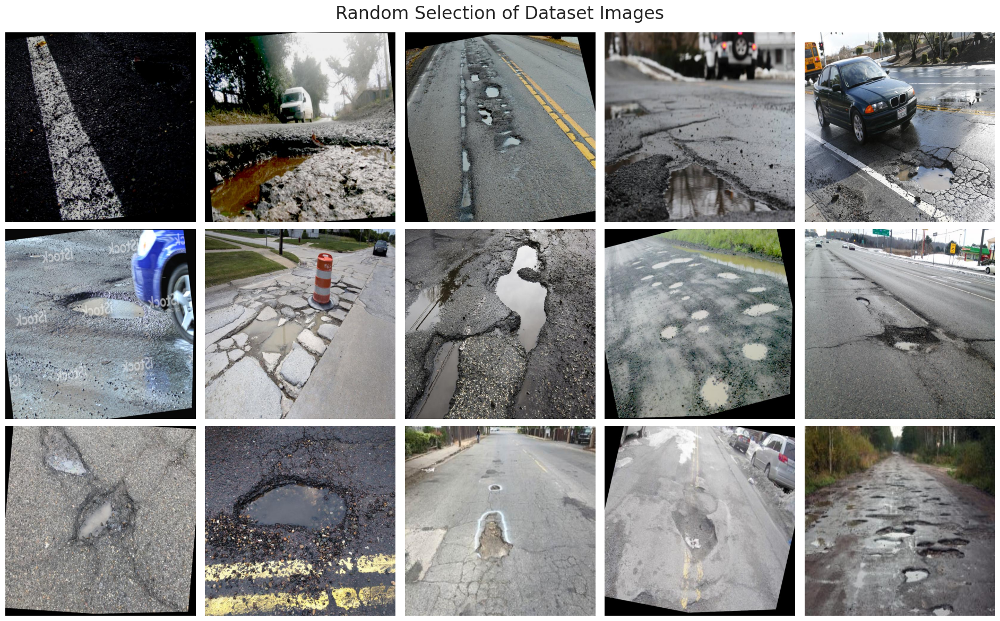

In [26]:
random.seed(0)

image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]

random_images = random.sample(image_files, 15)

plt.figure(figsize=(19, 12))

for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

plt.suptitle('Random Selection of Dataset Images', fontsize=24)

plt.tight_layout()
plt.show()

del image_files

In [29]:
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=10,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    patience=15,             # Epochs to wait for no observable improvement for early stopping of training
    batch=16,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate
    lrf=0.01,                # Final learning rate (lr0 * lrf)
    dropout=0.25,            # Use dropout regularization
    device='cpu',                # Device to run on, i.e. cuda device=0
    seed=42                  # Random seed for reproducibility
)

New https://pypi.org/project/ultralytics/8.3.89 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.0 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/drive/MyDrive/Dataset/data.yaml, epochs=10, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, sho

train: Scanning /content/drive/MyDrive/Dataset/train/labels.cache... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Dataset/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to runs/segment/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      1.477      2.664      2.384      1.504         34        640: 100%|██████████| 45/45 [15:03<00:00, 20.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.72s/it]

                   all         60        201      0.662     0.0878      0.285      0.144        0.7     0.0928      0.287      0.139



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      1.496      2.497      2.095      1.495         28        640: 100%|██████████| 45/45 [14:37<00:00, 19.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.61s/it]

                   all         60        201      0.315      0.438      0.295      0.148      0.355      0.388      0.309       0.13



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      1.537      2.513      1.885       1.52         38        640: 100%|██████████| 45/45 [14:41<00:00, 19.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:36<00:00, 18.18s/it]

                   all         60        201      0.378      0.348      0.302      0.131       0.38      0.338      0.271     0.0883



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      1.593      2.505      1.861      1.572         33        640: 100%|██████████| 45/45 [14:40<00:00, 19.56s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:35<00:00, 17.94s/it]

                   all         60        201      0.529      0.474      0.482      0.242      0.485      0.488      0.436      0.207



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      1.516      2.391      1.659      1.513         33        640: 100%|██████████| 45/45 [14:53<00:00, 19.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:41<00:00, 20.74s/it]

                   all         60        201      0.502      0.483      0.455      0.234       0.51      0.487      0.465      0.238



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      1.434      2.278      1.515       1.43         65        640: 100%|██████████| 45/45 [14:51<00:00, 19.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.57s/it]

                   all         60        201      0.556      0.612      0.575      0.293      0.611      0.622      0.608        0.3



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G      1.383      2.204       1.37       1.38         42        640: 100%|██████████| 45/45 [14:40<00:00, 19.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:39<00:00, 19.55s/it]

                   all         60        201      0.657      0.617      0.622      0.321       0.66      0.602      0.617      0.292



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      1.371      2.137      1.309      1.374         47        640: 100%|██████████| 45/45 [14:47<00:00, 19.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:35<00:00, 17.50s/it]

                   all         60        201       0.61      0.678      0.669      0.381      0.629      0.699      0.678      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      1.277       2.03      1.177      1.319         65        640: 100%|██████████| 45/45 [14:31<00:00, 19.37s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:35<00:00, 17.84s/it]

                   all         60        201      0.637      0.612      0.652      0.376      0.612      0.687      0.664      0.349



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      1.229      1.965      1.116      1.281         40        640: 100%|██████████| 45/45 [14:29<00:00, 19.32s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:37<00:00, 18.60s/it]

                   all         60        201      0.648      0.677      0.681      0.405      0.702      0.693      0.716      0.379



10 epochs completed in 2.562 hours.
Optimizer stripped from runs/segment/train2/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train2/weights/best.pt, 6.8MB

Validating runs/segment/train2/weights/best.pt...
Ultralytics YOLOv8.1.0 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:30<00:00, 15.39s/it]


                   all         60        201      0.646      0.677      0.679      0.403      0.699      0.697      0.714      0.378
Speed: 5.1ms preprocess, 369.4ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/segment/train2


lr/pg0,▂▆█▇▇▆▅▃▂▁
lr/pg1,▂▆█▇▇▆▅▃▂▁
lr/pg2,▂▆█▇▇▆▅▃▂▁
metrics/mAP50(B),▁▁▁▅▄▆▇███
metrics/mAP50(M),▁▂▁▄▄▆▆▇▇█
metrics/mAP50-95(B),▁▁▁▄▄▅▆▇▇█
metrics/mAP50-95(M),▂▂▁▄▅▆▆▇▇█
metrics/precision(B),█▁▂▅▅▆█▇██
metrics/precision(M),█▁▂▄▄▆▇▇▆█
metrics/recall(B),▁▅▄▆▆▇▇█▇█
metrics/recall(M),▁▄▄▆▆▇▇███


In [41]:
!find runs/ -name "results.png"

runs/segment/train2/results.png


In [44]:
post_training_files_path = 'runs/segment/train2'

!ls {post_training_files_path}

args.yaml					    labels_correlogram.jpg  train_batch0.jpg
BoxF1_curve.png					    labels.jpg		    train_batch1.jpg
BoxP_curve.png					    MaskF1_curve.png	    train_batch2.jpg
BoxPR_curve.png					    MaskP_curve.png	    val_batch0_labels.jpg
BoxR_curve.png					    MaskPR_curve.png	    val_batch0_pred.jpg
confusion_matrix_normalized.png			    MaskR_curve.png	    val_batch1_labels.jpg
confusion_matrix.png				    results.csv		    val_batch1_pred.jpg
events.out.tfevents.1741856564.88826e52c1ed.1052.1  results.png		    weights


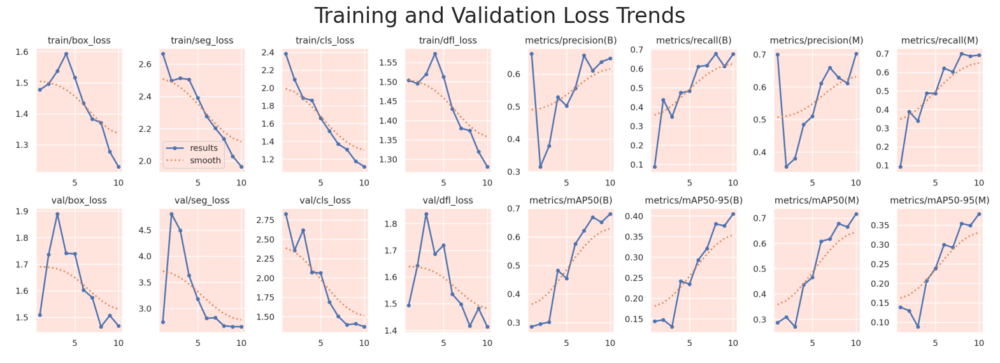

In [45]:
results_file_path = os.path.join(post_training_files_path, 'results.png')

image = cv2.imread(results_file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 8))
plt.imshow(image)
plt.title('Training and Validation Loss Trends', fontsize=24)
plt.axis('off')
plt.show()

In [47]:
def plot_learning_curve(df, train_loss_col, val_loss_col, title, ylim_range=[0,2]):
    plt.figure(figsize=(12, 4))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='blue', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='#ed2f00', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim(ylim_range)
    plt.legend()
    plt.show()

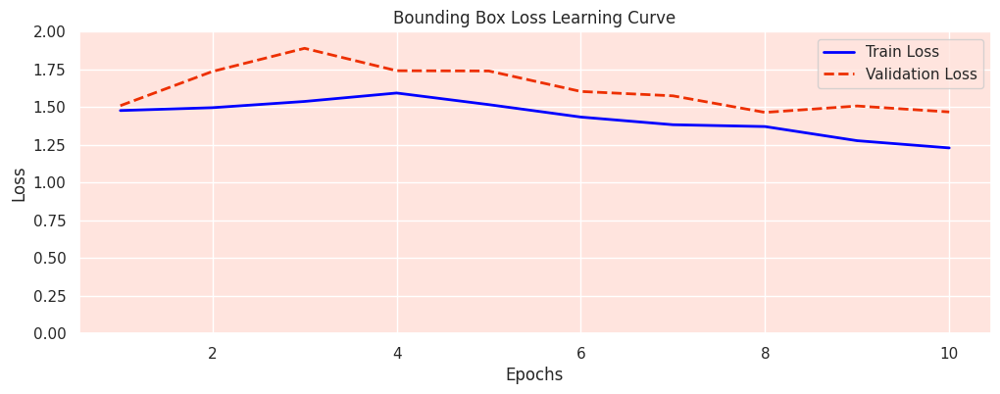

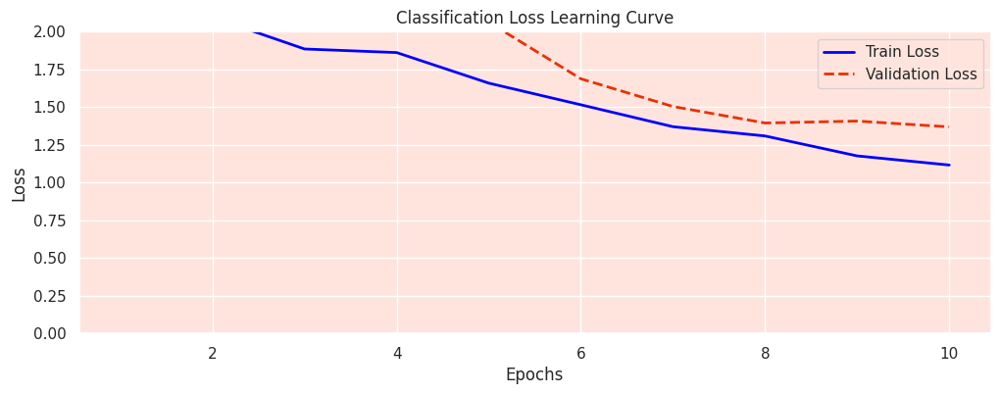

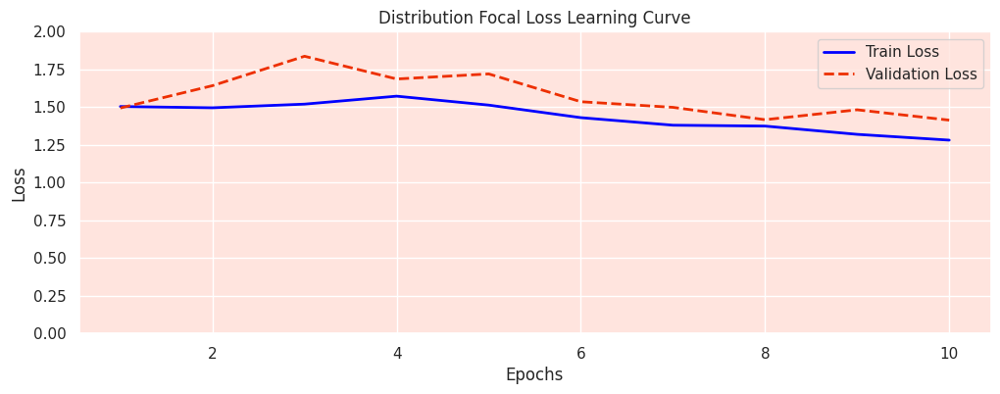

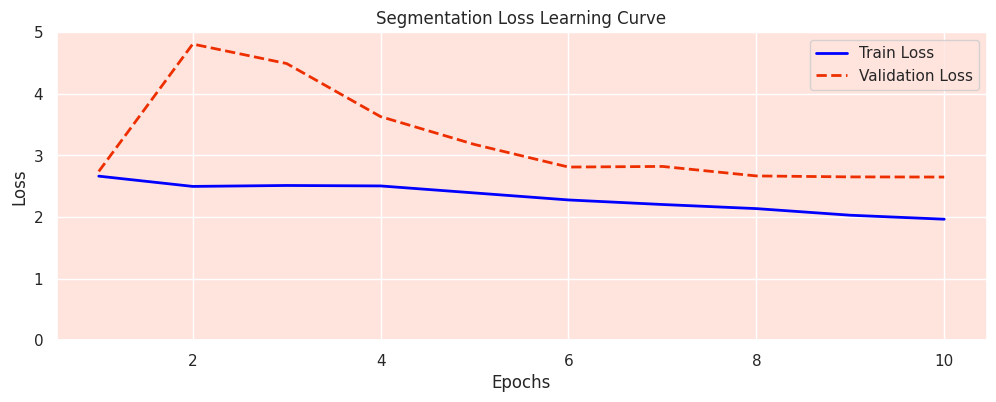

In [48]:
results_csv_path = os.path.join(post_training_files_path, 'results.csv')

df = pd.read_csv(results_csv_path)

df.columns = df.columns.str.strip()

plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Bounding Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')
plot_learning_curve(df, 'train/seg_loss', 'val/seg_loss', 'Segmentation Loss Learning Curve', ylim_range=[0,5])

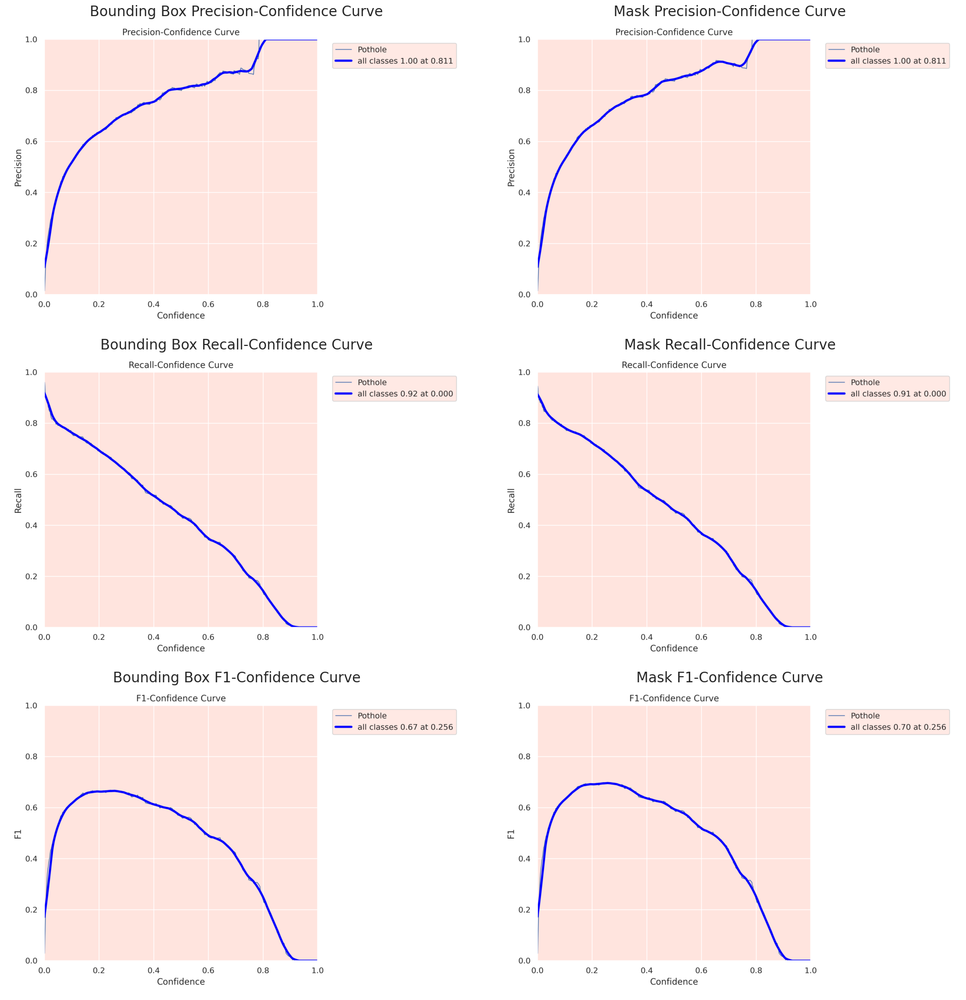

In [49]:
box_files_titles = {
    'BoxP_curve.png': 'Bounding Box Precision-Confidence Curve',
    'BoxR_curve.png': 'Bounding Box Recall-Confidence Curve',
    'BoxF1_curve.png': 'Bounding Box F1-Confidence Curve'
}
mask_files_titles = {
    'MaskP_curve.png': 'Mask Precision-Confidence Curve',
    'MaskR_curve.png': 'Mask Recall-Confidence Curve',
    'MaskF1_curve.png': 'Mask F1-Confidence Curve'
}


fig, axs = plt.subplots(3, 2, figsize=(20, 20))

def read_and_convert_image(file_path):
    image = cv2.imread(file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

for i, (filename, title) in enumerate(box_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 0].imshow(img)
    axs[i, 0].set_title(title, fontsize=20)
    axs[i, 0].axis('off')

for i, (filename, title) in enumerate(mask_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i, 1].imshow(img)
    axs[i, 1].set_title(title, fontsize=20)
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()

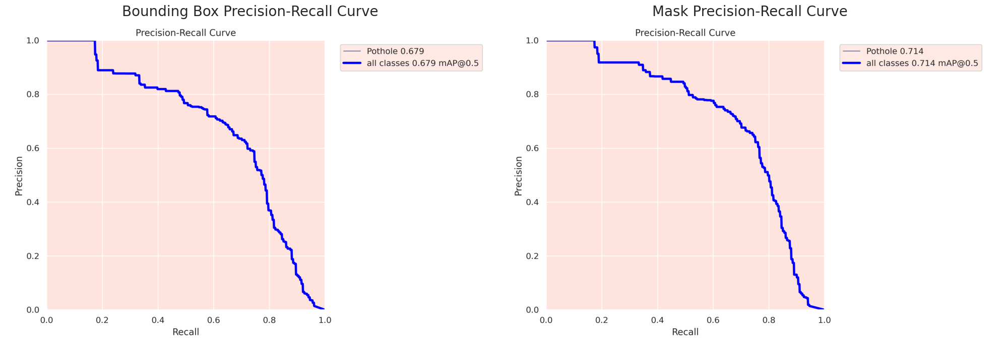

In [50]:
pr_files_titles = {
    'BoxPR_curve.png': 'Bounding Box Precision-Recall Curve',
    'MaskPR_curve.png': 'Mask Precision-Recall Curve'
}

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

for i, (filename, title) in enumerate(pr_files_titles.items()):
    img_path = os.path.join(post_training_files_path, filename)
    img = read_and_convert_image(img_path)
    axs[i].imshow(img)
    axs[i].set_title(title, fontsize=20)
    axs[i].axis('off')

plt.tight_layout()
plt.show()

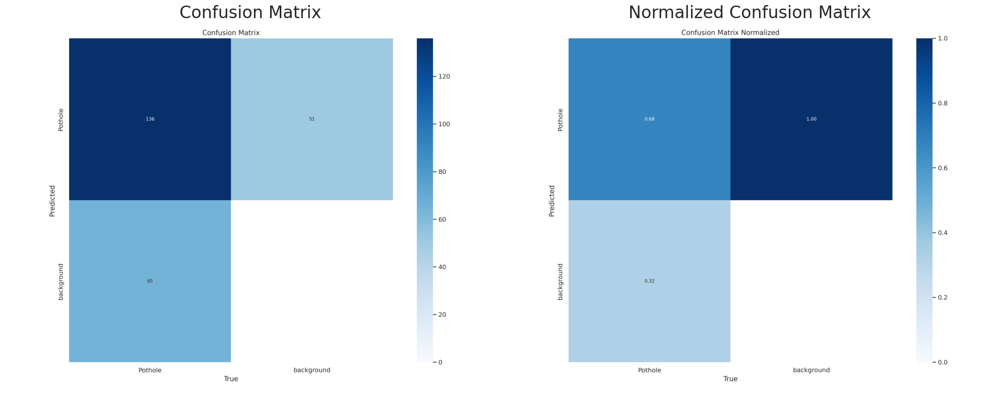

In [51]:
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix.png')
confusion_matrix_normalized_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

fig, axs = plt.subplots(1, 2, figsize=(20, 10))

cm_img = read_and_convert_image(confusion_matrix_path)
cm_norm_img = read_and_convert_image(confusion_matrix_normalized_path)

axs[0].imshow(cm_img)
axs[0].set_title('Confusion Matrix', fontsize=24)
axs[0].axis('off')

axs[1].imshow(cm_norm_img)
axs[1].set_title('Normalized Confusion Matrix', fontsize=24)
axs[1].axis('off')

plt.tight_layout()
plt.show()

In [52]:
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

best_model = YOLO(best_model_path)

metrics = best_model.val(split='val')

Ultralytics YOLOv8.1.0 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


val: Scanning /content/drive/MyDrive/Dataset/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:30<00:00,  7.57s/it]


                   all         60        201      0.646      0.677      0.679      0.403      0.699      0.697      0.714      0.378
Speed: 5.3ms preprocess, 395.4ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/segment/val


In [53]:
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])

metrics_df.round(3)

,Metric Value
metrics/precision(B),0.646
metrics/recall(B),0.677
metrics/mAP50(B),0.679
metrics/mAP50-95(B),0.403
metrics/precision(M),0.699
metrics/recall(M),0.697
metrics/mAP50(M),0.714
metrics/mAP50-95(M),0.378
fitness,0.842



image 1/1 /content/drive/MyDrive/Dataset/valid/images/pic-184-_jpg.rf.cb753b5f714073fc4a8c2de602386399.jpg: 640x640 8 Potholes, 488.1ms
Speed: 7.5ms preprocess, 488.1ms inference, 57.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Dataset/valid/images/pic-144-_jpg.rf.61a3b886f058ed3a4788426cfa7c4988.jpg: 640x640 1 Pothole, 449.7ms
Speed: 4.6ms preprocess, 449.7ms inference, 10.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Dataset/valid/images/pic-175-_jpg.rf.9fc746d4865c11f38047cf383baa30a6.jpg: 640x640 2 Potholes, 436.5ms
Speed: 4.3ms preprocess, 436.5ms inference, 13.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Dataset/valid/images/pic-114-_jpg.rf.a0f30e06b3b96d7879d5f55a7012433c.jpg: 640x640 1 Pothole, 466.0ms
Speed: 4.1ms preprocess, 466.0ms inference, 10.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Dataset/valid/images/pic

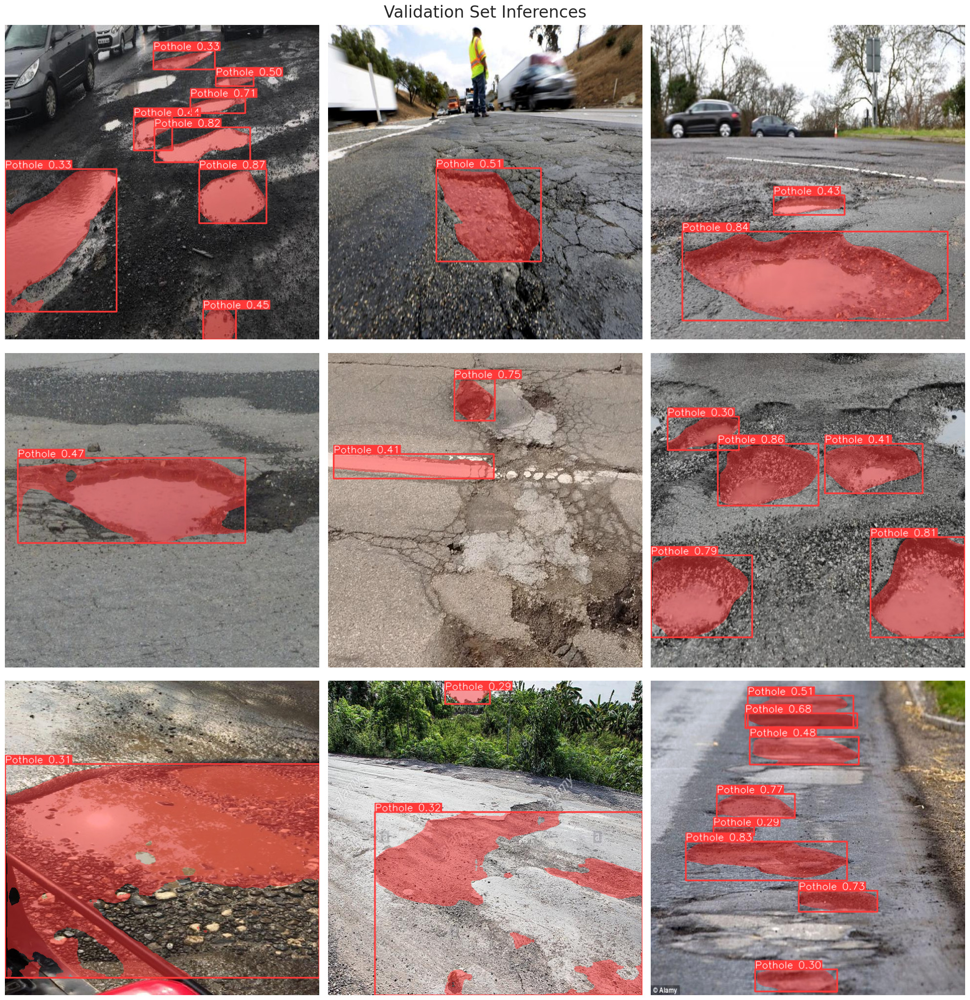

In [54]:
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [55]:
best_model.export(format='onnx')

Ultralytics YOLOv8.1.0 🚀 Python-3.11.11 torch-2.5.1+cu124 CPU (Intel Xeon 2.20GHz)

PyTorch: starting from 'runs/segment/train2/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (6.5 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 103.8 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 9.5s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: export success ✅ 11.0s, saved as 'runs/segment/train2/weights/best.onnx' (12.6 MB)

Export complete (12.8s)
Results saved to /content/runs/segment/train2/weights
Predict:         yolo predict task=segment model=runs/segment/train2/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=runs/segment/train2/weights/best.onnx imgsz=640 data=/conte

'runs/segment/train2/weights/best.onnx'


image 1/1 /content/drive/MyDrive/Dataset/valid/images/pic-271-_jpg.rf.0210435cf32159dca447e61250afb67f.jpg: 640x640 3 Potholes, 531.3ms
Speed: 10.1ms preprocess, 531.3ms inference, 30.8ms postprocess per image at shape (1, 3, 640, 640)


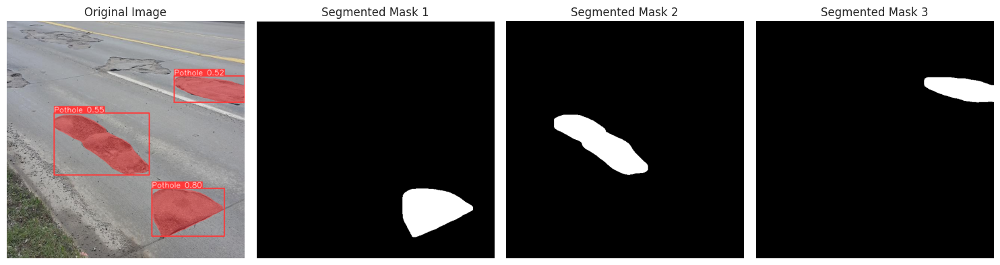

In [56]:
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

selected_image = image_files[45]

image_path = os.path.join(valid_images_path, selected_image)
results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
annotated_image = results[0].plot()
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

num_subplots = 1 + (len(results[0].masks.data) if results[0].masks is not None else 0)

fig, axes = plt.subplots(1, num_subplots, figsize=(15, 5))

axes[0].imshow(annotated_image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

if results[0].masks is not None:
    masks = results[0].masks.data.cpu().numpy()
    for i, mask in enumerate(masks):
        # Threshold the mask to make sure it's binary
        # Any value greater than 0 is set to 255, else it remains 0
        binary_mask = (mask > 0).astype(np.uint8) * 255
        axes[i+1].imshow(binary_mask, cmap='gray')
        axes[i+1].set_title(f'Segmented Mask {i+1}')
        axes[i+1].axis('off')

plt.tight_layout()
plt.show()

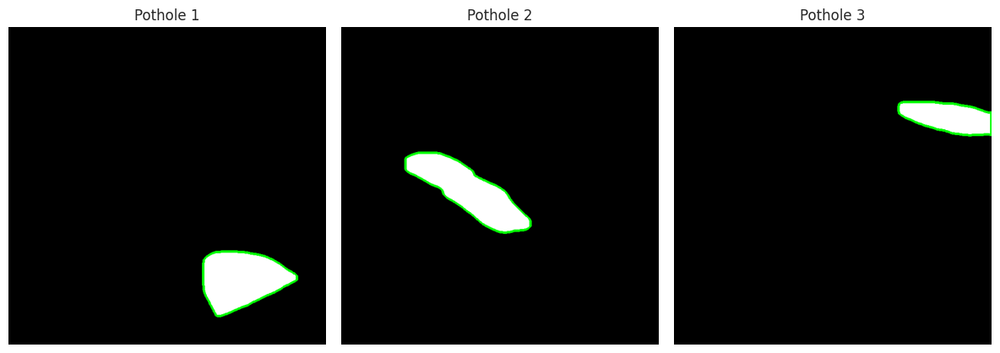

Area of Pothole 1: 16438.0 pixels
Area of Pothole 2: 17476.0 pixels
Area of Pothole 3: 9099.0 pixels
--------------------------------------------------
Total Damaged Area by Potholes: 43013.0 pixels
Total Pixels in Image: 409600 pixels
Percentage of Road Damaged: 10.50%


In [57]:
total_area = 0
area_list = []

fig, axes = plt.subplots(1, len(masks), figsize=(12, 8))

if results[0].masks is not None:
    masks = results[0].masks.data.cpu().numpy()   # Retrieve masks as numpy arrays
    image_area = masks.shape[1] * masks.shape[2]  # Calculate total number of pixels in the image
    for i, mask in enumerate(masks):
        binary_mask = (mask > 0).astype(np.uint8) * 255  # Convert mask to binary
        color_mask = cv2.cvtColor(binary_mask, cv2.COLOR_GRAY2BGR)  # Convert binary mask to color
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)  # Find contours in the binary mask
        contour = contours[0]  # Retrieve the first contour
        area = cv2.contourArea(contour)  # Calculate the area of the pothole
        area_list.append(area)  # Append area to the list
        cv2.drawContours(color_mask, [contour], -1, (0, 255, 0), 3)  # Draw the contour on the mask

        axes[i].imshow(color_mask)
        axes[i].set_title(f'Pothole {i+1}')
        axes[i].axis('off')

plt.tight_layout()
plt.show()

for i, area in enumerate(area_list):
    print(f"Area of Pothole {i+1}: {area} pixels")
    total_area += area  # Sum the areas for total

print("-"*50)
print(f"Total Damaged Area by Potholes: {total_area} pixels")
print(f"Total Pixels in Image: {image_area} pixels")
print(f"Percentage of Road Damaged: {(total_area / image_area) * 100:.2f}%")